Importing the necessary libraries.

In [134]:
import pandas as pd
import xlrd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

Reading an Excel file named "Dry_Bean_Dataset.xlsx" located at the specified path into a Pandas DataFrame called df.

In [49]:
df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/Dry_Bean_Dataset.xlsx')

Information about dataset.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

Description about dataset.

In [ ]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


The first 5 data in the dataset.

In [ ]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


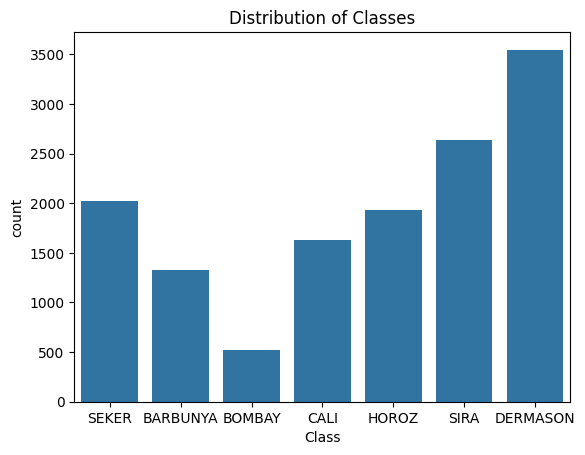

In [5]:
sns.countplot(x='Class', data=df)
plt.title('Distribution of Classes')
plt.show()

It creates a grid that visualizes the relationship and distribution between variables over the dataset and colors the data points according to different classes in the 'Class' column.

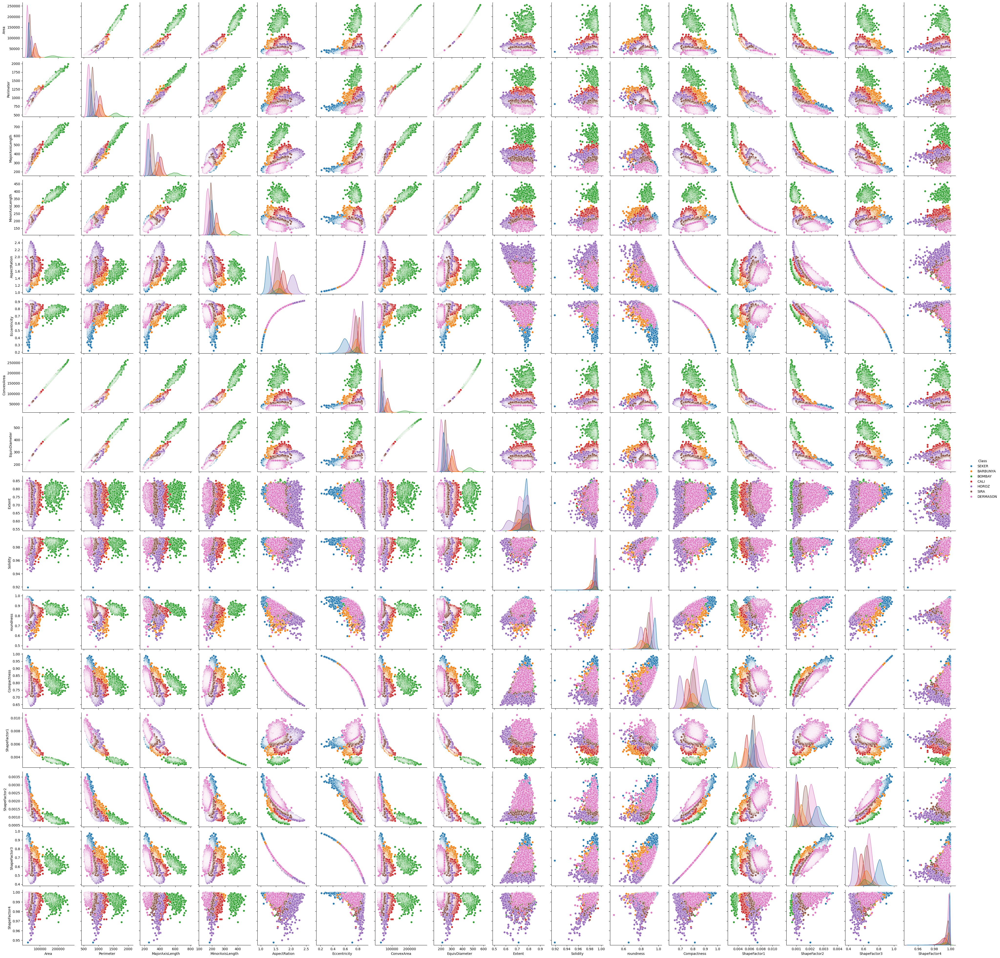

In [ ]:
sns.pairplot(df, hue='Class')
plt.show()

Normalizing the features in the dataset using Z-Score normalization, thus transforming the data to have a mean of zero and a standard deviation of one for each feature.

In [50]:
# Z-Score Normalization
scaler = StandardScaler()
normalized_data = scaler.fit_transform(df.iloc[:, :-1])
df_normalized = pd.DataFrame(normalized_data, columns=df.columns[:-1])
# To preserve the original indexing layout
df_normalized.index = df.index
df_normalized.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,-0.840749,-1.143319,-1.306598,-0.631153,-1.565053,-2.185720,-0.841451,-1.063341,0.289087,0.367613,1.423867,1.839116,0.680786,2.402173,1.925723,0.838371
1,-0.829188,-1.013924,-1.395911,-0.434445,-1.969784,-3.686040,-0.826102,-1.044217,0.697477,-0.462907,0.231054,2.495449,0.367967,3.100893,2.689702,0.771138
2,-0.807157,-1.078829,-1.252357,-0.585735,-1.514291,-2.045336,-0.808704,-1.008084,0.578195,0.518417,1.252865,1.764843,0.603129,2.235091,1.841356,0.916755
3,-0.785741,-0.977215,-1.278825,-0.439290,-1.741618,-2.742211,-0.773975,-0.973337,0.671260,-2.241767,0.515049,2.081715,0.401718,2.515075,2.204250,-0.197985
4,-0.781239,-1.097384,-1.380471,-0.266663,-2.117993,-4.535028,-0.784286,-0.966080,0.476020,0.804772,1.874992,2.765330,0.118268,3.270983,3.013462,0.939640


Creating the correlation matrix for feature elimination.

In [95]:
# Select a subset of continuous variables
numeric_columns = df_normalized.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
correlation_matrix = numeric_columns.corr()

# Print the correlation matrix
print(correlation_matrix)

                     Area  Perimeter  MajorAxisLength  MinorAxisLength  \
Area             1.000000   0.966722         0.931834         0.951602   
Perimeter        0.966722   1.000000         0.977338         0.913179   
MajorAxisLength  0.931834   0.977338         1.000000         0.826052   
MinorAxisLength  0.951602   0.913179         0.826052         1.000000   
AspectRation     0.241735   0.385276         0.550335        -0.009161   
Eccentricity     0.267481   0.391066         0.541972         0.019574   
ConvexArea       0.999939   0.967689         0.932607         0.951339   
EquivDiameter    0.984968   0.991380         0.961733         0.948539   
Extent           0.054345  -0.021160        -0.078062         0.145957   
Solidity        -0.196585  -0.303970        -0.284302        -0.155831   
roundness       -0.357530  -0.547647        -0.596358        -0.210344   
Compactness     -0.268067  -0.406857        -0.568377        -0.015066   
ShapeFactor1    -0.847958  -0.864623  

Finding feature pairs with high correlation according to the 0.8 threshold and printing them to the screen.

In [96]:
# Set a specific threshold to find highly correlated feature pairs
threshold = 0.8

# Find highly correlated feature pairs by traversing the correlation matrix
high_correlation = np.where(np.abs(correlation_matrix) > threshold)

# Print correlation pairs to the screen
for i, j in zip(*high_correlation):
    if i != j and i < j:
        print(f"{df_normalized.columns[i]} - {df_normalized.columns[j]}: {correlation_matrix.iloc[i, j]}")

Area - Perimeter: 0.9667221821788864
Area - MajorAxisLength: 0.931833594712872
Area - MinorAxisLength: 0.9516015990191683
Area - ConvexArea: 0.9999392261797531
Area - EquivDiameter: 0.9849675237713976
Area - ShapeFactor1: -0.8479583276678291
Perimeter - MajorAxisLength: 0.9773377498852289
Perimeter - MinorAxisLength: 0.9131785552664543
Perimeter - ConvexArea: 0.9676892116996367
Perimeter - EquivDiameter: 0.9913804295980603
Perimeter - ShapeFactor1: -0.8646229449782007
MajorAxisLength - MinorAxisLength: 0.8260515498022211
MajorAxisLength - ConvexArea: 0.932607013897118
MajorAxisLength - EquivDiameter: 0.9617333598397135
MajorAxisLength - ShapeFactor2: -0.8592376422660652
MinorAxisLength - ConvexArea: 0.9513393286697142
MinorAxisLength - EquivDiameter: 0.9485388939185418
MinorAxisLength - ShapeFactor1: -0.9472041671038238
AspectRation - Eccentricity: 0.9242925542796079
AspectRation - Compactness: -0.9876872990527648
AspectRation - ShapeFactor2: -0.8378412167244348
AspectRation - ShapeFac

Filtering highly correlated features and printing the results to the screen.

In [130]:
# Creating a new data set by combining the normalized data set with the original data set containing class labels
df_merged = pd.concat([df_normalized, df["Class"]], axis=1)

# Extracting features with high correlation coefficient.
df_filtered = df_merged.drop(['MinorAxisLength', 'ConvexArea', 'ShapeFactor3','EquivDiameter', 'Compactness', 'MajorAxisLength', 'Perimeter', 'Eccentricity', 'ShapeFactor2'], axis=1)

# Print filtered dataset.
print(df_filtered.head())

       Area  AspectRation    Extent  Solidity  roundness  ShapeFactor1  \
0 -0.840749     -1.565053  0.289087  0.367613   1.423867      0.680786   
1 -0.829188     -1.969784  0.697477 -0.462907   0.231054      0.367967   
2 -0.807157     -1.514291  0.578195  0.518417   1.252865      0.603129   
3 -0.785741     -1.741618  0.671260 -2.241767   0.515049      0.401718   
4 -0.781239     -2.117993  0.476020  0.804772   1.874992      0.118268   

   ShapeFactor4  Class  
0      0.838371  SEKER  
1      0.771138  SEKER  
2      0.916755  SEKER  
3     -0.197985  SEKER  
4      0.939640  SEKER  


Training the support vector classifier model with preprocessed data and examining the performance of the model using cross validation.

In [146]:
# Separating the dataset into dependent and independent variables
X = df_filtered.drop("Class", axis=1)
y = df_filtered["Class"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and training the SVM model with a linear kernel
svm_model = SVC(kernel='linear', random_state=42)  # Using a linear kernel
svm_model.fit(X_train, y_train)

# Making predictions on the test data
y_pred = svm_model.predict(X_test)

# Calculating F1 scores with cross-validation
f1_scores_cv = cross_val_score(svm_model, X, y, cv=10, scoring='f1_weighted')

# Printing the obtained F1 scores
print("Cross-validation F1 Scores:", f1_scores_cv)

# Evaluating the overall performance of the model by calculating the average F1 score
print("Average F1 Score:", f1_scores_cv.mean())

# Constructing the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculating precision
precision = precision_score(y_test, y_pred, average='weighted')

# Calculating recall
recall = recall_score(y_test, y_pred, average='weighted')

# Calculating F1 score
f1 = f1_score(y_test, y_pred, average='weighted')

# Printing the confusion matrix
print("\nConfusion Matrix:")
print(conf_matrix)

# Printing accuracy, precision, recall, and F1 score
print("\nAccuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Cross-validation F1 Scores: [0.59616579 0.89526079 0.96828625 0.98086994 0.98007761 0.98162692
 0.96627941 0.95964323 0.90963135 0.53279176]
Average F1 Score: 0.8770633049716536

Confusion Matrix:
[[240   0  17   0   0   1   3]
 [  0 117   0   0   0   0   0]
 [ 11   0 300   0   4   1   1]
 [  0   0   0 611   1   7  52]
 [  1   0   3   5 396   0   3]
 [  5   0   0  10   0 389   9]
 [  0   0   0  46   8   5 477]]

Accuracy: 0.9291222915901579
Precision: 0.929423800385525
Recall: 0.9291222915901579
F1 Score: 0.9292312123768185


Training the decision tree classifier model with preprocessed data and examining the performance of the model using cross validation.

In [147]:
# Separating the dataset into dependent and independent variables
X = df_filtered.drop("Class", axis=1)
y = df_filtered["Class"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and training the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Making predictions on the test data
y_pred = dt_model.predict(X_test)

# Calculating F1 scores with cross-validation
f1_scores_cv = cross_val_score(dt_model, X, y, cv=10, scoring='f1_weighted')

# Printing the obtained F1 scores
print("Cross-validation F1 Scores:", f1_scores_cv)

# Evaluating the overall performance of the model by calculating the average F1 score
print("Average F1 Score:", f1_scores_cv.mean())

# Constructing the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculating precision
precision = precision_score(y_test, y_pred, average='weighted')

# Calculating recall
recall = recall_score(y_test, y_pred, average='weighted')

# Calculating F1 score
f1 = f1_score(y_test, y_pred, average='weighted')

# Printing the confusion matrix
print("\nConfusion Matrix:")
print(conf_matrix)

# Printing accuracy, precision, recall, and F1 score
print("\nAccuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Cross-validation F1 Scores: [0.37071176 0.58973174 0.72832791 0.76162342 0.93522412 0.66856386
 0.64529734 0.58230835 0.50841915 0.21062441]
Average F1 Score: 0.6000832064799015

Confusion Matrix:
[[226   0  22   0   0   4   9]
 [  0 117   0   0   0   0   0]
 [ 14   0 294   0   7   0   2]
 [  0   0   0 590   4  11  66]
 [  2   0   9   3 384   0  10]
 [  5   0   1  21   0 375  11]
 [  2   0   5  55  17  13 444]]

Accuracy: 0.892398090341535
Precision: 0.8927220984141507
Recall: 0.892398090341535
F1 Score: 0.8924339209264827


Training the knn classifier model with preprocessed data and examining the performance of the model using cross validation.

In [148]:
# Separating the dataset into dependent and independent variables
X = df_filtered.drop("Class", axis=1)
y = df_filtered["Class"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=39)

# Creating and training the KNN model
knn = KNeighborsClassifier(n_neighbors=17, weights='distance', metric='manhattan')
knn.fit(X_train, y_train)

# Making predictions on the test data
y_pred = knn.predict(X_test)

# Calculating F1 scores with cross-validation
f1_scores_cv = cross_val_score(knn, X, y, cv=10, scoring='f1_weighted')

# Printing the obtained F1 scores
print("Cross-validation F1 Scores:", f1_scores_cv)

# Evaluating the overall performance of the model by calculating the average F1 score
print("Average F1 Score:", f1_scores_cv.mean())

# Constructing the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculating precision
precision = precision_score(y_test, y_pred, average='weighted')

# Calculating recall
recall = recall_score(y_test, y_pred, average='weighted')

# Calculating F1 score
f1 = f1_score(y_test, y_pred, average='weighted')

# Printing the confusion matrix
print("\nConfusion Matrix:")
print(conf_matrix)

# Printing accuracy, precision, recall, and F1 score
print("\nAccuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Cross-validation F1 Scores: [0.71020315 0.88000203 0.94361752 0.97569096 0.9741654  0.96839372
 0.96397573 0.94202588 0.88721676 0.67386712]
Average F1 Score: 0.8919158252553638

Confusion Matrix:
[[232   0  19   0   0   1   2]
 [  0 114   0   0   0   0   0]
 [  4   0 316   0   7   0   6]
 [  0   0   0 646   2  10  48]
 [  0   0   6   2 368   0   3]
 [  3   0   0   7   0 399  11]
 [  2   0   1  45   6   3 460]]

Accuracy: 0.9309585016525891
Precision: 0.9314624411182387
Recall: 0.9309585016525891
F1 Score: 0.9310855595055468


Deciding that the most accurate results are obtained with the Knn model and performing hyperparameter optimization using grid search cross validation.

In [149]:
# Defining possible values of parameters
parameters = {
    'n_neighbors': np.arange(1, 50),
    'metric': ['euclidean', 'manhattan', 'chebyshev'],
    'weights': ['uniform', 'distance']
}

# Creating GridSearchCV
cv = GridSearchCV(KNeighborsClassifier(), param_grid=parameters, cv=5)

# Training the model
cv.fit(X_train, y_train)

print("Best parameters:", cv.best_params_)
print("Best accuracy score:", cv.best_score_)

Best parameters: {'metric': 'manhattan', 'n_neighbors': 17, 'weights': 'distance'}
Best accuracy score: 0.9258823673322357


Creating and training KNN models using Manhattan distance for different K values, calculating the F1 score of each model, and visualizing these scores graphically.

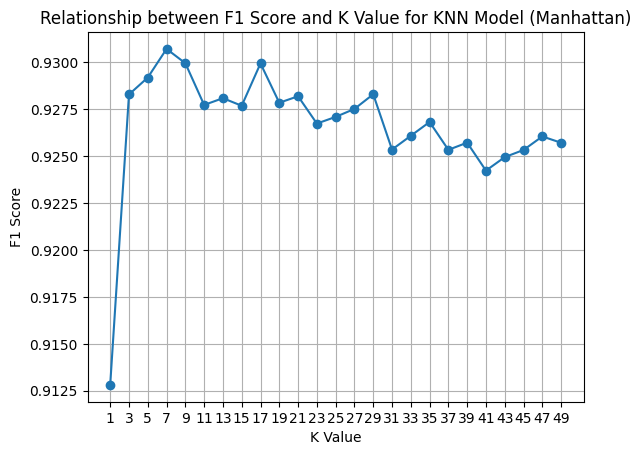

In [150]:
k_values = range(1, 51, 2)
f1_scores = []

# Creating and training KNN models for different k values
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k, metric='manhattan')
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    f1 = f1_score(y_test, y_pred, average='weighted')
    f1_scores.append(f1)

# Plotting the graph
plt.plot(k_values, f1_scores, marker='o')
plt.title('Relationship between F1 Score and K Value for KNN Model (Manhattan)')
plt.xlabel('K Value')
plt.ylabel('F1 Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()

Creating and training KNN models using weighted distance for different K values, calculating the F1 score of each model, and visualizing these scores graphically.

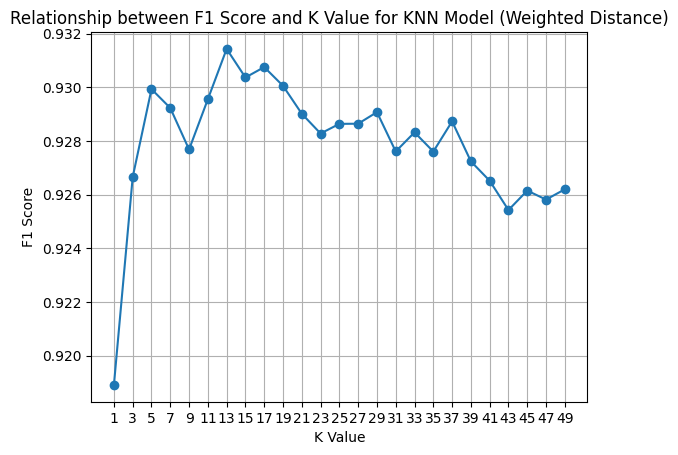

In [151]:
# Define a range of K values from 1 to 51 (exclusive) with a step size of 2
k_values = range(1, 51, 2)

# Initialize an empty list to store F1 scores
f1_scores = []

# Iterate over different K values
for k in k_values:
    # Create a KNN model with the current K value and using weighted distance
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance')

    # Train the KNN model on the training data
    knn.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = knn.predict(X_test)

    # Compute the weighted F1 score for the predictions
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Append the computed F1 score to the list
    f1_scores.append(f1)

# Plot the relationship between K values and F1 scores
plt.plot(k_values, f1_scores, marker='o')
plt.title('Relationship between F1 Score and K Value for KNN Model (Weighted Distance)')
plt.xlabel('K Value')
plt.ylabel('F1 Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()

Creating and training KNN models using Manhattan and weighted distance for different K values, calculating the F1 score of each model, and visualizing these scores graphically.

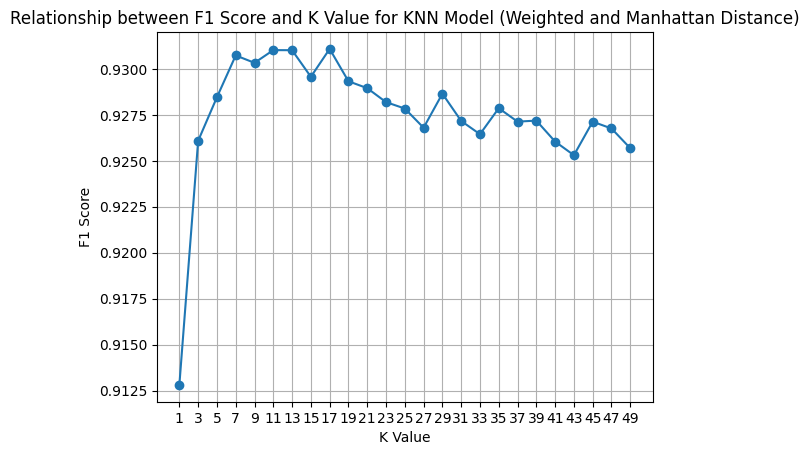

In [152]:
# Define a range of K values from 1 to 51 (exclusive) with a step size of 2
k_values = range(1, 51, 2)

# Initialize an empty list to store F1 scores
f1_scores = []

# Iterate over different K values
for k in k_values:
    # Create a KNN model with the current K value, weighted distance, and Manhattan metric
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance', metric='manhattan')

    # Train the KNN model on the training data
    knn.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = knn.predict(X_test)

    # Compute the weighted F1 score for the predictions
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Append the computed F1 score to the list
    f1_scores.append(f1)

# Plot the relationship between K values and F1 scores
plt.plot(k_values, f1_scores, marker='o')
plt.title('Relationship between F1 Score and K Value for KNN Model (Weighted and Manhattan Distance)')
plt.xlabel('K Value')
plt.ylabel('F1 Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()

Creating and training KNN models for different K values, calculating the F1 score of each model, and visualizing these scores graphically.

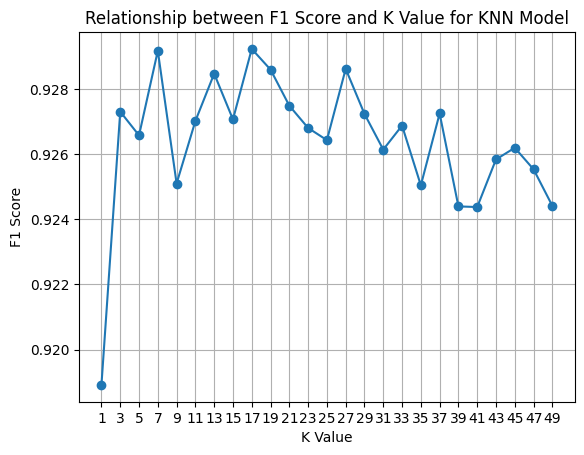

In [153]:
k_values = range(1, 51, 2)
f1_scores = []

# Creating and training KNN models with different K values
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    f1 = f1_score(y_test, y_pred, average='weighted')
    f1_scores.append(f1)

# Plotting the relationship between F1 score and K value for the KNN model
plt.plot(k_values, f1_scores, marker='o')
plt.title('Relationship between F1 Score and K Value for KNN Model')
plt.xlabel('K Value')
plt.ylabel('F1 Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()

Graphically showing the effect of test dimensions on F1 score.

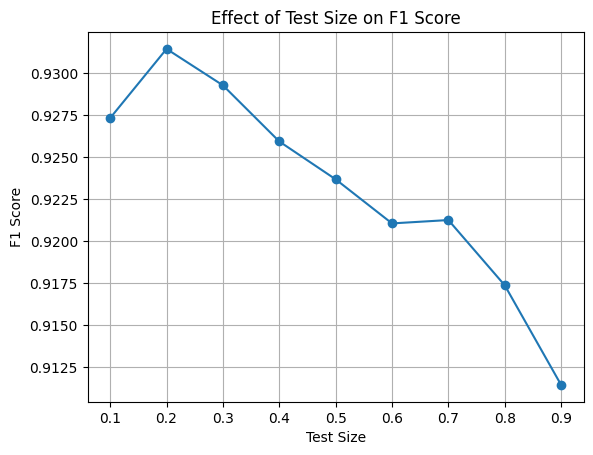

In [154]:
# Create empty lists for F1 scores and test sizes
f1_scores = []
test_sizes = []

# Create a loop for varying test sizes
for test_size in range(1, 10):
    test_size /= 10  # Change test size from 0.1 to 0.9
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=39)
    knn = KNeighborsClassifier(n_neighbors=13, weights='distance')
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    f1 = f1_score(y_test, y_pred, average='weighted')
    f1_scores.append(f1)
    test_sizes.append(test_size)

# Plot the F1 scores against the test sizes
plt.plot(test_sizes, f1_scores, marker='o')
plt.title('Effect of Test Size on F1 Score')
plt.xlabel('Test Size')
plt.ylabel('F1 Score')
plt.grid(True)
plt.show()